Необхідні бібліотеки:

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


2. Виведіть зображення в Colab за допомогою функції imread з бібліотеки matplotlib.

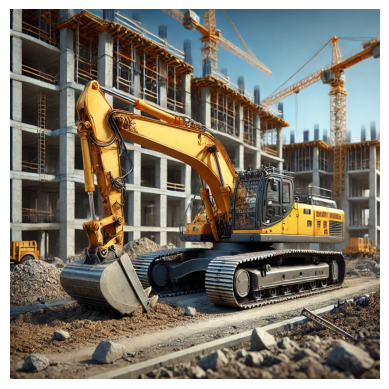

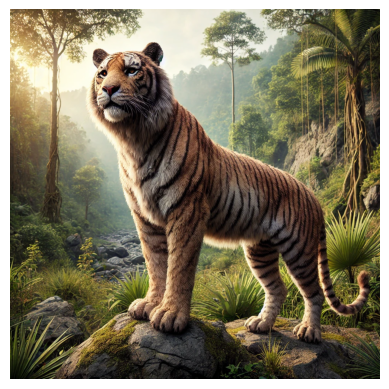

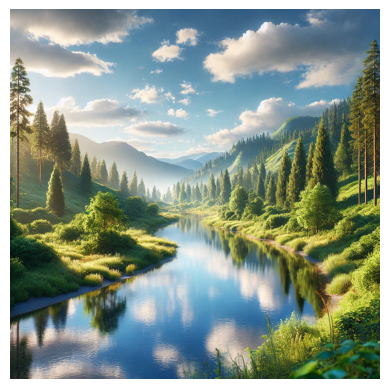

In [3]:
# Завантаження та показ зображення

images = ['/content/DALL_1.webp', '/content/DALL_2.webp', '/content/DALL_3.webp']

for img_path in images:
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()



3. Визначить розмір зображення за допомогою функції shape.

In [15]:
# Виведення розміру зображення
images = ['/content/DALL_1.webp', '/content/DALL_2.webp', '/content/DALL_3.webp']
for img_path in images:
  print("Розмір зображення:", img.shape)

Розмір зображення: (1024, 1024, 3)
Розмір зображення: (1024, 1024, 3)
Розмір зображення: (1024, 1024, 3)


4. В 2D-матрицю

In [16]:
# Згладжування зображення в 2D-матрицю

for img_path in images:
  # Визначення розмірів зображення
  height, width, channels = img.shape
  print(f"Original shape: {img.shape}")

  # Згладжування зображення в 2D-матрицю
  flat_image = img.reshape(height, width * channels)
  print(f"Reshaped to 2D: {flat_image.shape}")

Original shape: (1024, 1024, 3)
Reshaped to 2D: (1024, 3072)
Original shape: (1024, 1024, 3)
Reshaped to 2D: (1024, 3072)
Original shape: (1024, 1024, 3)
Reshaped to 2D: (1024, 3072)


5. Застосуйте SVD декомпозицію за допомогою функції svd з бібліотеки numpy.

In [19]:
import numpy as np
from numpy.linalg import svd


for img_path in images:

  print(f"\nОбробка файлу: {img_path}")

  # Визначення розмірів зображення
  height, width, channels = img.shape

  # Згладжування зображення в 2D-матрицю
  flat_image = img.reshape(height, width * channels)

  # Застосування SVD
  U, S, Vt = svd(flat_image, full_matrices=False)

  # Виведення результатів
  print("Розмір матриці U:", U.shape)
  print("Розмір матриці S:", S.shape)
  print("Розмір матриці Vt:", Vt.shape)



Обробка файлу: /content/DALL_1.webp
Розмір матриці U: (1024, 1024)
Розмір матриці S: (1024,)
Розмір матриці Vt: (1024, 3072)

Обробка файлу: /content/DALL_2.webp
Розмір матриці U: (1024, 1024)
Розмір матриці S: (1024,)
Розмір матриці Vt: (1024, 3072)

Обробка файлу: /content/DALL_3.webp
Розмір матриці U: (1024, 1024)
Розмір матриці S: (1024,)
Розмір матриці Vt: (1024, 3072)


6. Візуалізація перші k



Обробка файлу: /content/DALL_1.webp


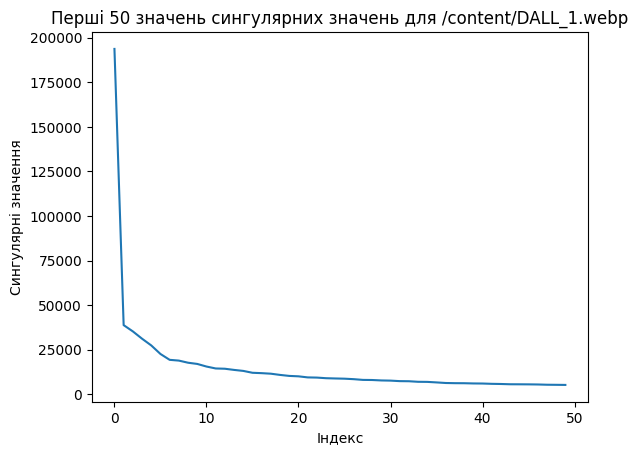


Обробка файлу: /content/DALL_2.webp


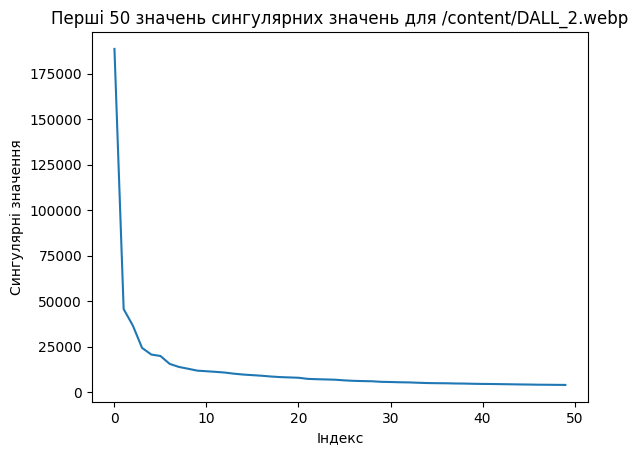


Обробка файлу: /content/DALL_3.webp


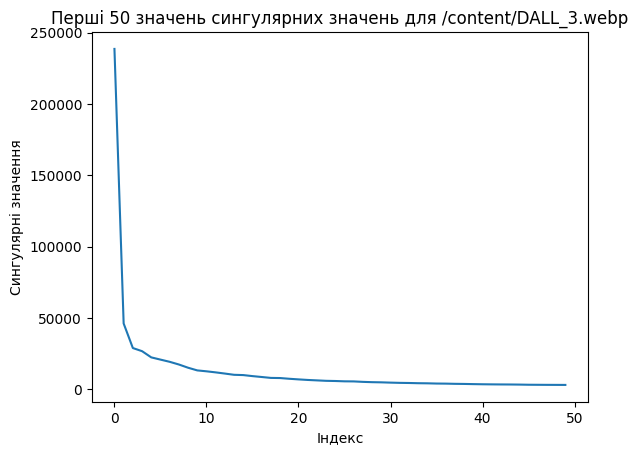

In [31]:
# Список зображень
images = ['/content/DALL_1.webp', '/content/DALL_2.webp', '/content/DALL_3.webp']

# Виберіть кількість значень для візуалізації
k = 50

for img_path in images:
    print(f"\nОбробка файлу: {img_path}")

    # Завантаження зображення
    img = mpimg.imread(img_path)

    # Визначення розмірів зображення
    height, width, channels = img.shape

    # Згладжування зображення в 2D-матрицю
    flat_image = img.reshape(height, width * channels)

    # Застосування SVD
    U, S, Vt = svd(flat_image, full_matrices=False)

    # Візуалізація перших k значень матриці Σ
    plt.plot(np.arange(k), S[:k])
    plt.title(f'Перші {k} значень сингулярних значень для {img_path}')
    plt.xlabel('Індекс')
    plt.ylabel('Сингулярні значення')
    plt.show()



Обробка файлу: /content/DALL_1.webp


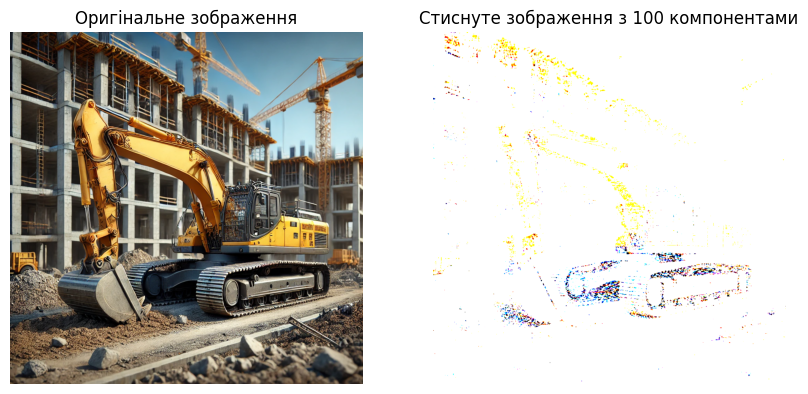


Обробка файлу: /content/DALL_2.webp


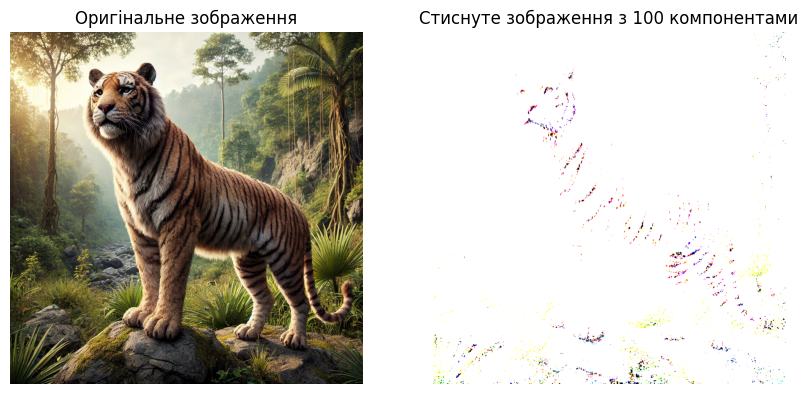


Обробка файлу: /content/DALL_3.webp


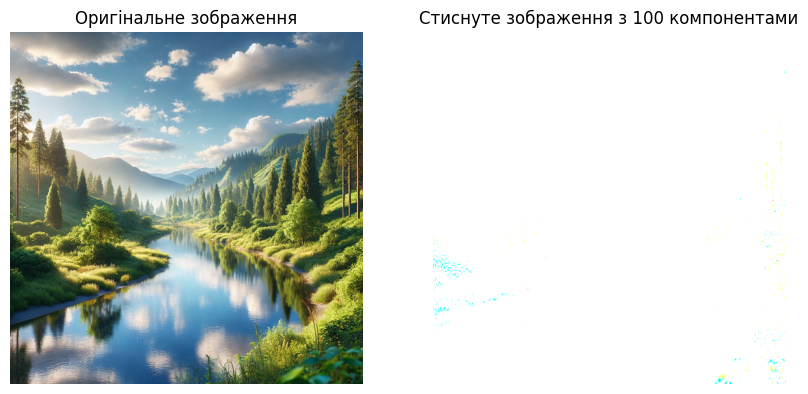

In [32]:
# Список зображень
images = ['/content/DALL_1.webp', '/content/DALL_2.webp', '/content/DALL_3.webp']

# Виберіть кількість значень для стиснення
k = 100

for img_path in images:
    print(f"\nОбробка файлу: {img_path}")

    # Завантаження зображення
    img = mpimg.imread(img_path)

    # Визначення розмірів зображення
    height, width, channels = img.shape

    # Згладжування зображення в 2D-матрицю
    flat_image = img.reshape(height, width * channels)

    # Застосування усіченого SVD
    svd = TruncatedSVD(n_components=k)
    truncated_image = svd.fit_transform(flat_image)

    # Відновлення зображення з стиснутої форми
    reconstructed_image = svd.inverse_transform(truncated_image)

    # Повернення зображення у вихідну форму для візуалізації
    reconstructed_image = reconstructed_image.reshape(height, width, channels)

    # Виведення оригінального та відновленого зображення для порівняння
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Оригінальне зображення
    axs[0].imshow(img)
    axs[0].axis('off')
    axs[0].set_title('Оригінальне зображення')

    # Відновлене зображення
    axs[1].imshow(np.clip(reconstructed_image, 0, 1))
    axs[1].axis('off')
    axs[1].set_title(f'Стиснуте зображення з {svd.n_components} компонентами')

    plt.show()


8. Щоб побачити, скільки інформації було втрачено


Обробка файлу: /content/DALL_1.webp
Помилка реконструкції (MSE) для /content/DALL_1.webp: 287.35785724240765


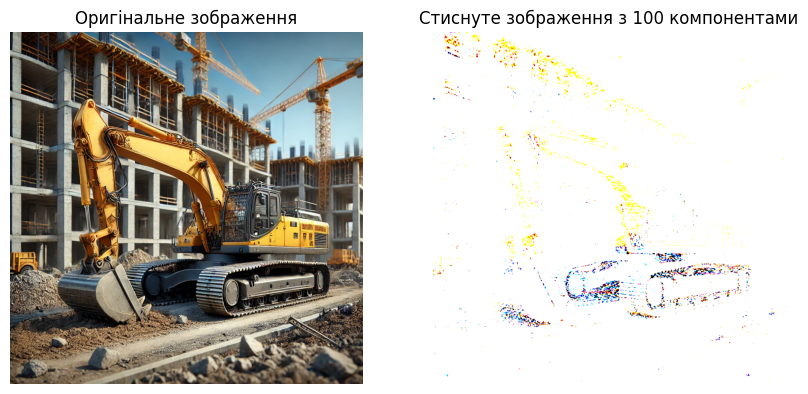


Обробка файлу: /content/DALL_2.webp
Помилка реконструкції (MSE) для /content/DALL_2.webp: 225.41885762159404


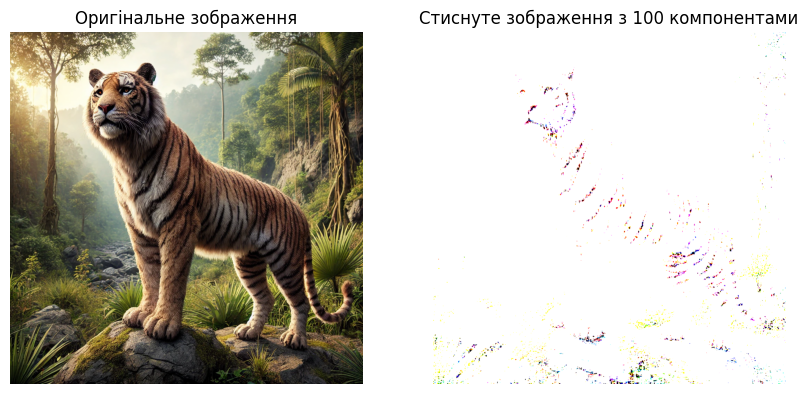


Обробка файлу: /content/DALL_3.webp
Помилка реконструкції (MSE) для /content/DALL_3.webp: 144.08867497092908


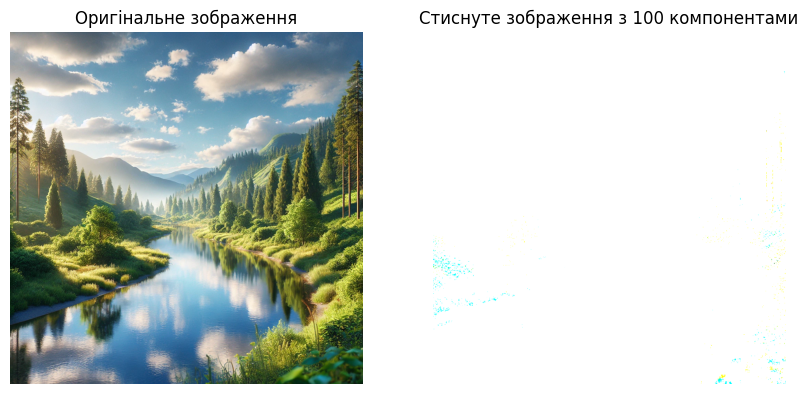

In [33]:
# Список зображень
images = ['/content/DALL_1.webp', '/content/DALL_2.webp', '/content/DALL_3.webp']

# Виберіть кількість значень для стиснення
k = 100

for img_path in images:
    print(f"\nОбробка файлу: {img_path}")

    # Завантаження зображення
    img = mpimg.imread(img_path)

    # Визначення розмірів зображення
    height, width, channels = img.shape

    # Згладжування зображення в 2D-матрицю
    flat_image = img.reshape(height, width * channels)

    # Застосування усіченого SVD
    svd = TruncatedSVD(n_components=k)
    truncated_image = svd.fit_transform(flat_image)

    # Відновлення зображення з стиснутої форми
    reconstructed_image = svd.inverse_transform(truncated_image)

    # Обчислення помилки реконструкції
    reconstruction_error = np.mean(np.square(reconstructed_image - flat_image))
    print(f"Помилка реконструкції (MSE) для {img_path}: {reconstruction_error}")

    # Повернення зображення у вихідну форму для візуалізації
    reconstructed_image = reconstructed_image.reshape(height, width, channels)

    # Виведення оригінального та відновленого зображення для порівняння
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Оригінальне зображення
    axs[0].imshow(img)
    axs[0].axis('off')
    axs[0].set_title('Оригінальне зображення')

    # Відновлене зображення
    axs[1].imshow(np.clip(reconstructed_image, 0, 1))
    axs[1].axis('off')
    axs[1].set_title(f'Стиснуте зображення з {svd.n_components} компонентами')

    plt.show()


9. Щоб візуалізувати реконстуйоване зображення


Обробка файлу: /content/DALL_1.webp
Помилка реконструкції (MSE) для /content/DALL_1.webp: 287.26830495625853


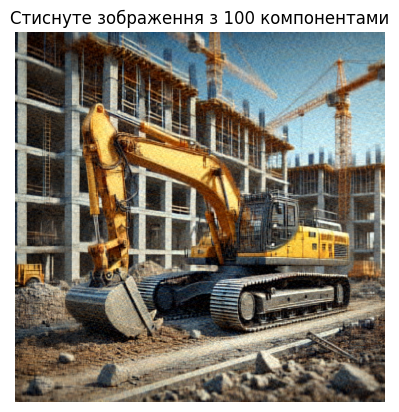


Обробка файлу: /content/DALL_2.webp
Помилка реконструкції (MSE) для /content/DALL_2.webp: 225.4405384139967


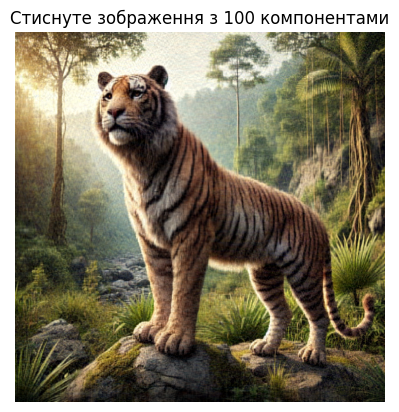


Обробка файлу: /content/DALL_3.webp
Помилка реконструкції (MSE) для /content/DALL_3.webp: 144.0144096844097


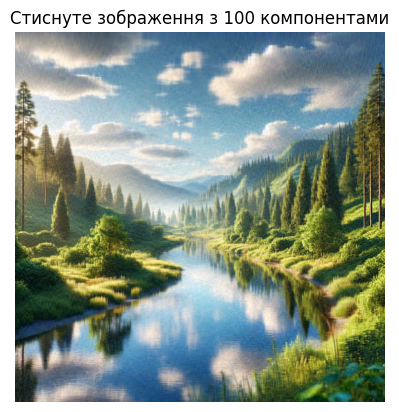

In [34]:
# Список зображень
images = ['/content/DALL_1.webp', '/content/DALL_2.webp', '/content/DALL_3.webp']

# Виберіть кількість значень для стиснення
k = 100

for img_path in images:
    print(f"\nОбробка файлу: {img_path}")

    # Завантаження зображення
    img = mpimg.imread(img_path)

    # Визначення розмірів зображення
    height, width, channels = img.shape

    # Згладжування зображення в 2D-матрицю
    flat_image = img.reshape(height, width * channels)

    # Застосування усіченого SVD
    svd = TruncatedSVD(n_components=k)
    truncated_image = svd.fit_transform(flat_image)

    # Відновлення зображення з стиснутої форми
    reconstructed_image = svd.inverse_transform(truncated_image)

    # Обчислення помилки реконструкції
    reconstruction_error = np.mean(np.square(reconstructed_image - flat_image))
    print(f"Помилка реконструкції (MSE) для {img_path}: {reconstruction_error}")

    # Повернення зображення у вихідну форму для візуалізації
    reconstructed_image = reconstructed_image.reshape(height, width, channels)

    # Обрізання значень пікселів до [0, 255] і перетворення до типу uint8
    reconstructed_image = np.clip(reconstructed_image, 0, 255).astype('uint8')

    # Візуалізація реконструйованого зображення
    plt.imshow(reconstructed_image)
    plt.axis('off')
    plt.title(f'Стиснуте зображення з {svd.n_components} компонентами')
    plt.show()


10. Виконайте експерименти із використання різних значень К


Обробка файлу: /content/DALL_1.webp
Помилка реконструкції (MSE) для k=5: 2123.4611495293875


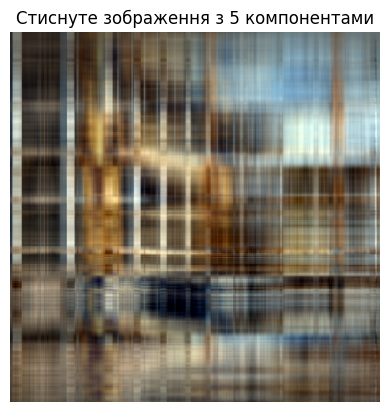

Помилка реконструкції (MSE) для k=20: 1015.443893073747


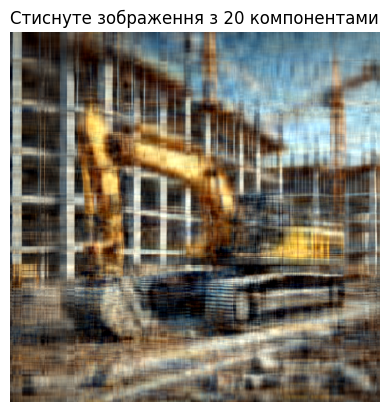

Помилка реконструкції (MSE) для k=50: 528.460490635694


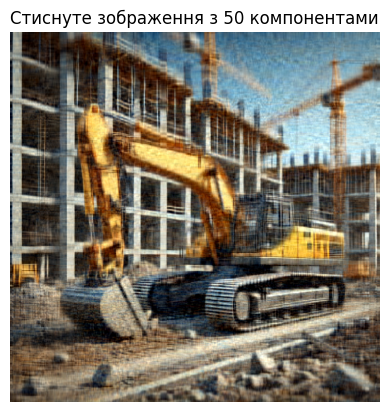

Помилка реконструкції (MSE) для k=100: 287.1870294996657


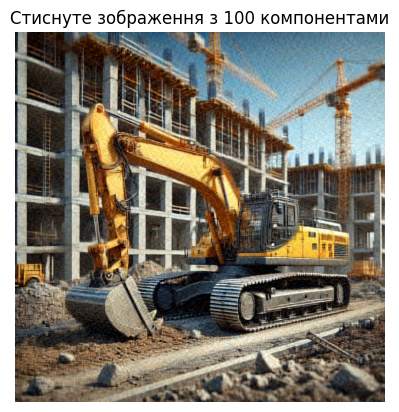

Помилка реконструкції (MSE) для k=200: 113.15989802878549


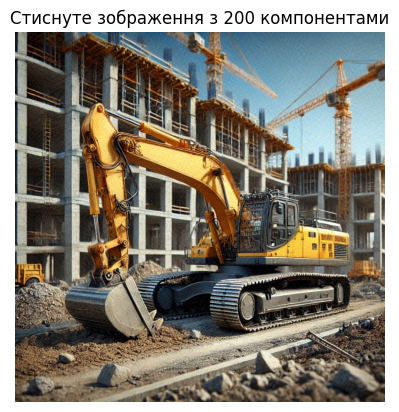


Обробка файлу: /content/DALL_2.webp
Помилка реконструкції (MSE) для k=5: 1336.1237717162605


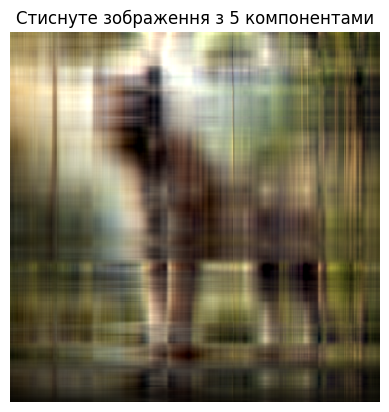

Помилка реконструкції (MSE) для k=20: 669.4643307969808


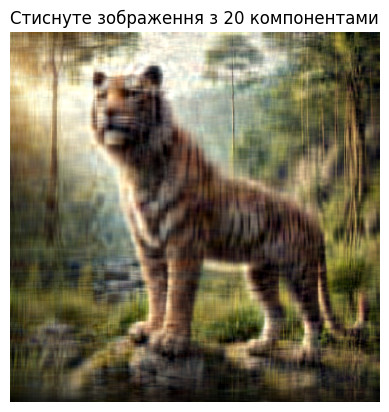

Помилка реконструкції (MSE) для k=50: 383.9077993039971


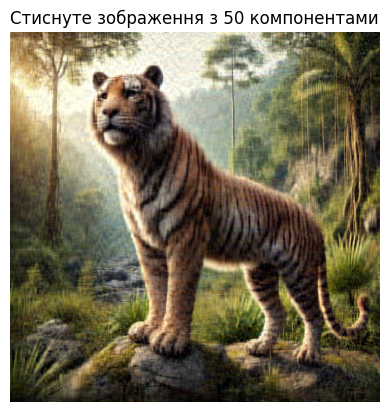

Помилка реконструкції (MSE) для k=100: 225.38547042790597


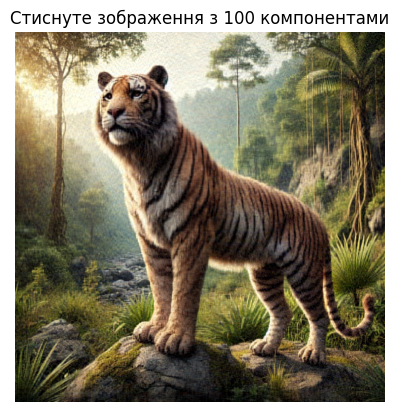

Помилка реконструкції (MSE) для k=200: 101.97627387935637


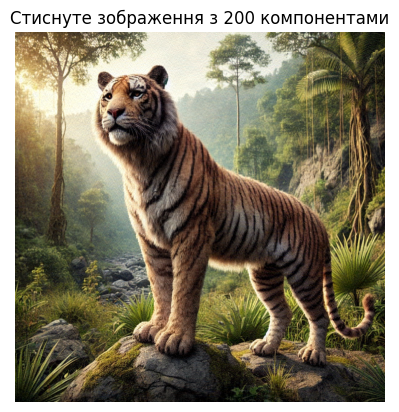


Обробка файлу: /content/DALL_3.webp
Помилка реконструкції (MSE) для k=5: 1243.5007944369188


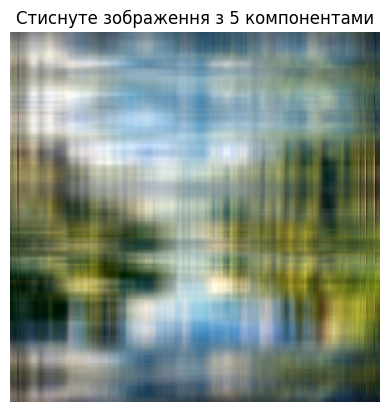

Помилка реконструкції (MSE) для k=20: 443.1512240858022


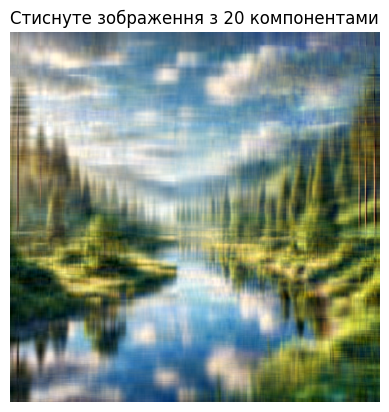

Помилка реконструкції (MSE) для k=50: 237.38922102405004


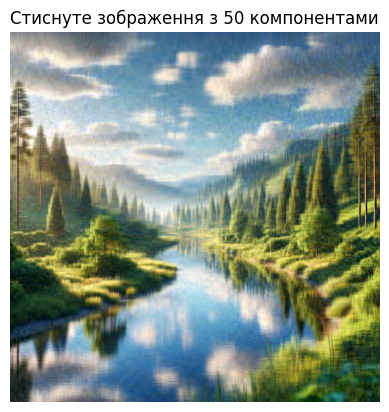

Помилка реконструкції (MSE) для k=100: 144.06781153249676


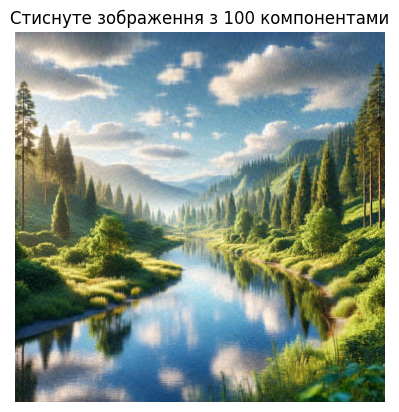

Помилка реконструкції (MSE) для k=200: 67.586320660058


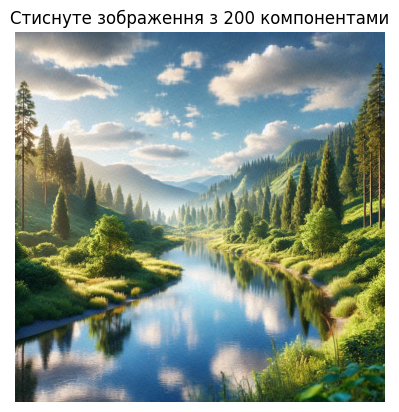

In [35]:
# Список зображень
images = ['/content/DALL_1.webp', '/content/DALL_2.webp', '/content/DALL_3.webp']

# Список різних значень k для експериментів
k_values = [5, 20, 50, 100, 200]

for img_path in images:
    print(f"\nОбробка файлу: {img_path}")

    # Завантаження зображення
    img = mpimg.imread(img_path)

    # Визначення розмірів зображення
    height, width, channels = img.shape

    # Згладжування зображення в 2D-матрицю
    flat_image = img.reshape(height, width * channels)

    for k in k_values:
        # Застосування усіченого SVD
        svd = TruncatedSVD(n_components=k)
        truncated_image = svd.fit_transform(flat_image)

        # Відновлення зображення з стиснутої форми
        reconstructed_image = svd.inverse_transform(truncated_image)

        # Обчислення помилки реконструкції
        reconstruction_error = np.mean(np.square(reconstructed_image - flat_image))
        print(f"Помилка реконструкції (MSE) для k={k}: {reconstruction_error}")

        # Повернення зображення у вихідну форму для візуалізації
        reconstructed_image = reconstructed_image.reshape(height, width, channels)

        # Обрізання значень пікселів до [0, 255] і перетворення до типу uint8
        reconstructed_image = np.clip(reconstructed_image, 0, 255).astype('uint8')

        # Візуалізація реконструйованого зображення
        plt.imshow(reconstructed_image)
        plt.axis('off')
        plt.title(f'Стиснуте зображення з {k} компонентами')
        plt.show()


## Висновки

1. **Малі значення \( k \) (5, 20):**
   - При малих значеннях \( k \), якість реконструйованого зображення суттєво погіршується.
   - Зображення виглядає розмитим та втрачає деталі.
   - MSE при таких значеннях є найбільшим, що свідчить про значну втрату інформації під час стиснення.

2. **Помірні значення \( k \) (50, 100):**
   - При значеннях \( k \) в діапазоні 50-100 зображення стає більш чітким, але все ще є деякі втрати у дрібних деталях.
   - Якість зображення помітно покращується порівняно з меншими значеннями \( k \).
   - MSE значно знижується, що свідчить про кращу якість реконструкції.

3. **Великі значення \( k \) (200):**
   - При великих значеннях \( k \), таких як 200, реконструйоване зображення виглядає майже ідентичним оригіналу.
   - Втрата якості є мінімальною, а MSE є найнижчою серед усіх значень \( k \).
   - Це означає, що більше компонент у SVD дозволяє зберегти більшу частину інформації.

4. **Оптимальне значення \( k \):**
   - Оптимальне значення \( k \) залежить від того, наскільки якість зображення важлива для завдання.
   - Наприклад, для деяких завдань може бути достатньо \( k = 50 \), щоб зберегти основні елементи зображення, водночас зменшивши його розмір.
